# Setup

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import sys
import os
from pathlib import Path
from random import random

import pandas as pd
#import dask.dataframe as dd # https://docs.dask.org/en/latest/dataframe.html
import numpy as np

from Bio import SeqIO

import matplotlib.pyplot as plt
import seaborn as sns

# Train dataset (Challenge reference genomes)

## Data frame setup

### Read fasta files into df

In [3]:
PATH_REF = Path('ChallengeRefGenomes')

In [6]:
# based on https://github.com/fastai/fastai_docs/blob/master/dev_course/dl2/08_data_block.ipynb
def get_files(path, extension='.fasta'):
    path = Path(path)
    fs = [f for f in os.scandir(path) if (not str(f).startswith('.') and f.name.endswith(extension))]
    return fs

In [5]:
def get_fasta_df(path, extension='.fasta'):
    seq, lbs = [], []
    for f in get_files(path, extension=extension):
        for rec in SeqIO.parse(f, 'fasta'):
            seq.append(str(rec.seq.upper())) # append sequence
            lbs.append(str(rec.name)) # append sequence name
    df = pd.DataFrame({'label': lbs, 'sequence': seq})
    assert df.isna().sum().sum() == 0 # check for NaN values
    assert df.duplicated().sum() == 0 # check for duplicates
    return df

In [6]:
df = get_fasta_df(PATH_REF)

In [7]:
df.shape

(1694, 2)

In [9]:
df.head()

,label,sequence
0,CR_443_Contig_0,ATCCAATTATTGGTAAAAGAAAATAAAAATTTTATAAGCGGCGTGC...
1,CR_494_Contig_0,AAACGTGGAGCACTTACTGGCTCGAAAGAAAGCGTGATCATCGCAT...
2,CR_494_Contig_1,ATTGACTGCTCATTTATGGGTCATGAAGAGTCTCTGATGTTGTTTT...
3,CR_494_Contig_2,AACTTGAAGCCGTCTTTACGGATTAGCGTTGTCACGCAGGCTTTGT...
4,CR_494_Contig_3,TGATTTCGCCCATAATATTGGCGTCAGCATGGTTATCGGCAATTAT...


In [10]:
# save df as csv file
df.to_csv('ChallengeRefGenomes.csv', index=False)

### Test load df

In [11]:
df = pd.read_csv('ChallengeRefGenomes.csv')

In [13]:
df.shape

(1694, 2)

In [14]:
df.head()

,label,sequence
0,CR_443_Contig_0,ATCCAATTATTGGTAAAAGAAAATAAAAATTTTATAAGCGGCGTGC...
1,CR_494_Contig_0,AAACGTGGAGCACTTACTGGCTCGAAAGAAAGCGTGATCATCGCAT...
2,CR_494_Contig_1,ATTGACTGCTCATTTATGGGTCATGAAGAGTCTCTGATGTTGTTTT...
3,CR_494_Contig_2,AACTTGAAGCCGTCTTTACGGATTAGCGTTGTCACGCAGGCTTTGT...
4,CR_494_Contig_3,TGATTTCGCCCATAATATTGGCGTCAGCATGGTTATCGGCAATTAT...


## Exploratory data analysis (EDA)

### Calculate contig total base pair length and count

In [56]:
df = pd.read_csv('ChallengeRefGenomes.csv')

In [57]:
# get only genome name
df['species'] = df['label'].apply(lambda x: x.split('_')[1])

In [58]:
# get sequence length
df['length'] = df['sequence'].apply(lambda x: len(x))

In [59]:
df['length'].sum()

2050889780

In [60]:
# total sequence length in bp
total_length = df['length'].sum()
print(f'{total_length:.2e}')

2.05e+09


In [61]:
df.describe()

,length
count,1.694000e+03
mean,1.210679e+06
std,1.745196e+06
min,2.500000e+02
25%,1.895825e+04
50%,1.135795e+05
75%,2.261265e+06
max,8.934655e+06


In [62]:
#df.describe(include=['O'])

In [63]:
df.head()

,label,sequence,species,length
0,CR_443_Contig_0,ATCCAATTATTGGTAAAAGAAAATAAAAATTTTATAAGCGGCGTGC...,443,11477
1,CR_494_Contig_0,AAACGTGGAGCACTTACTGGCTCGAAAGAAAGCGTGATCATCGCAT...,494,19511
2,CR_494_Contig_1,ATTGACTGCTCATTTATGGGTCATGAAGAGTCTCTGATGTTGTTTT...,494,29108
3,CR_494_Contig_2,AACTTGAAGCCGTCTTTACGGATTAGCGTTGTCACGCAGGCTTTGT...,494,622989
4,CR_494_Contig_3,TGATTTCGCCCATAATATTGGCGTCAGCATGGTTATCGGCAATTAT...,494,3944186


In [64]:
# save df as csv file
df.to_csv('ChallengeRefGenomes_ext.csv', index=False)

### Contig lengths and counts

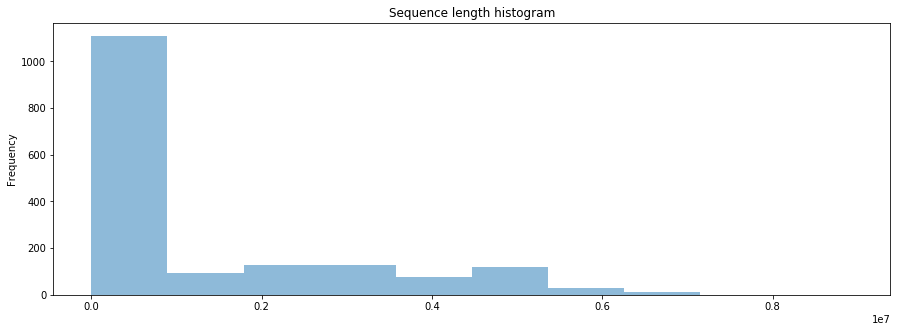

In [65]:
df['length'].plot(kind='hist', alpha=0.5, figsize=(15,5), title='Sequence length histogram');
#range=[0, 1e7], 

In [66]:
# get the total contig length of the sequences per species
df_pv = pd.pivot_table(df, values='length', index='species', aggfunc='sum').sort_values(by='length', ascending=False)


In [67]:
# calculate the percentage of the contig length of the sequences per species in %
df_pv['length_percentage'] = df_pv['length']/df_pv['length'].sum()*100

In [68]:
#  add contig count
df_pv['contig_count'] = pd.pivot_table(df, values='length', index='species', aggfunc='count').sort_values(by='length', ascending=False)

In [69]:
df_pv.head(10)

,length,length_percentage,contig_count
species,,,
195,35796027,1.745390,25
487,34011430,1.658374,71
475,33443056,1.630661,56
73,9009338,0.439289,7
319,8934655,0.435648,1
37,8890828,0.433511,5
398,8809615,0.429551,4
143,8613087,0.419968,5
428,8569715,0.417854,4


In [70]:
df_pv.tail(10)

,length,length_percentage,contig_count
species,,,
406,11276,0.000550,1
445,11256,0.000549,1
15,11142,0.000543,2
74,10772,0.000525,1
59,10771,0.000525,1
208,10771,0.000525,1
210,10709,0.000522,3
425,10493,0.000512,2
125,10368,0.000506,1


We have 517 different species and the species with the highest contig lentgh percentage has only 1,75% of the total contig length.

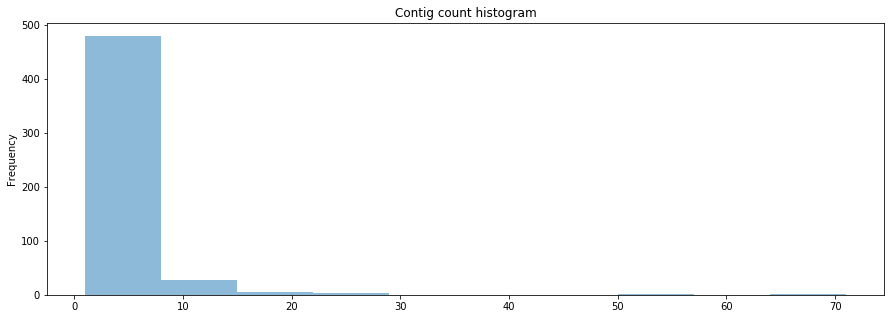

In [71]:
df_pv['contig_count'].plot(kind='hist', alpha=0.5, figsize=(15,5), title='Contig count histogram');

In [72]:
df_pv.to_csv('ChallengeRefGenomes_ext_species_length.csv', index=False)

### Figure total contig base pair length and contig count per species

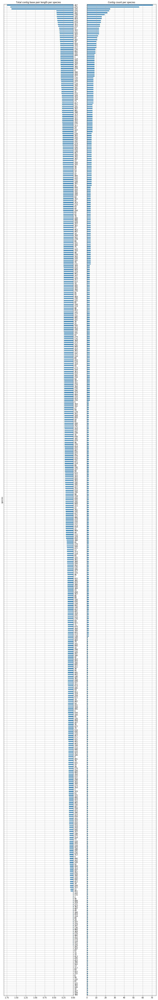

In [73]:
# based on https://stackoverflow.com/questions/44049132/python-pandas-plotting-two-barh-side-by-side
fig, (ax, ax2) = plt.subplots(ncols=2, sharey=True, figsize=(15,100))
ax.set_title('Total contig base pair length per species')
ax2.set_title('Contig count per species')
ax.invert_xaxis()
ax.yaxis.tick_right()
df_pv['length_percentage'].sort_values().plot.barh(ax=ax, alpha=0.5, legend=False, grid=True)
df_pv['contig_count'].sort_values().plot.barh(ax=ax2, alpha=0.5, legend=False, grid=True)
plt.show();

The higher the contig sequence count the higher the total contig sequence base pair sum.

### Split sequences into smaller fragments

In [74]:
# tokenizer crashes when the sequences above 1e6 bp are included, 
# therefore, we cut sequences longer than 1e6 into 1e6 parts

In [75]:
n = 1000 #int(1e6)

In [76]:
# Disamble and assemble df to have sequences in max n bp per row
# based on https://mikulskibartosz.name/how-to-split-a-list-inside-a-dataframe-cell-into-rows-in-pandas-9849d8ff2401

def split_seq(df, n):
    
    start_len = len(df)
    
    label = []
    sequence = []
    species = []
    length = []

    for _, row in df.iterrows():    
        if row.length < n:
            label.append(row.label)
            sequence.append(row.sequence)
            species.append(row.species)
            length.append(row.length)
        else:
            sqs = [row.sequence[i:i+n] if i+n < row.length else row.sequence[i:] for i in range(0, row.length, n)]

            for sq in sqs:
                label.append(row.label)
                sequence.append(sq)
                species.append(row.species)
                length.append(row.length)

    df = pd.DataFrame({'label': label, 'sequence': sequence, 'species': species, 'length_orig': length})
    df['length'] = df['sequence'].apply(lambda x: len(x))
    
    # check if there are sequences longer than n
    assert df[df['length'] > n].sum().sum() == 0
    
    end_len = len(df)
    
    print(f'df row count changed by {(end_len-start_len)/start_len*100:.2f}% \n({end_len} vs. {start_len})')
    
    return df


In [77]:
df = split_seq(df, n)

df row count changed by 121017.71% 
(2051734 vs. 1694)


In [78]:
df.tail()

,label,sequence,species,length_orig,length
2051729,CR_89_Contig_1,AGATGGGCGGATTTCCACACAGCACCTTGCCCGGCAAGGTGGGCCG...,89,79084,1000
2051730,CR_89_Contig_1,GCGGCAGCGGCGCCCGGCAAGGTGGGCCGATTCCCATATCGACATG...,89,79084,1000
2051731,CR_89_Contig_1,CTCAGAAGCCTTCCCGGGCCTTATCCGGCAGACTCACAGAAAAATC...,89,79084,1000
2051732,CR_89_Contig_1,GATCGGCGACAACGTCACCCGCCTTGACCGCTGGGAAACGGAACTG...,89,79084,1000
2051733,CR_89_Contig_1,CCGCAGCCAGCCGGCTGACGGCGCGCACGCCGCCCGAGACGCTGAC...,89,79084,84


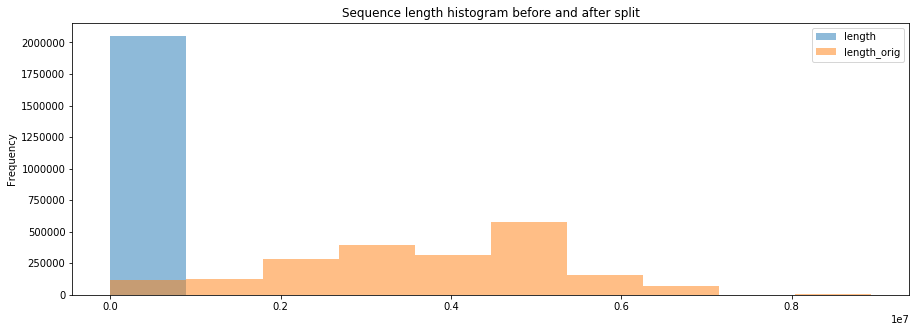

In [79]:
df[['length', 'length_orig']].plot(kind='hist', alpha=0.5, figsize=(15,5), title='Sequence length histogram before and after split');
#range=[0, 1e7], 

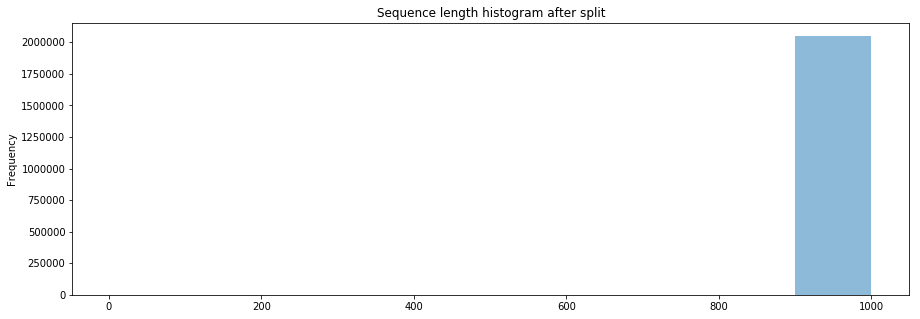

In [80]:
df['length'].plot(kind='hist', alpha=0.5, figsize=(15,5), title='Sequence length histogram after split');

In [81]:
df.shape

(2051734, 5)

In [82]:
# remove sequences smaller than 10 bp
df = df[df['length'] > 10]

In [83]:
df.shape

(2051720, 5)

In [84]:
assert df[df['length'] < 10].sum().sum() == 0

In [85]:
df.to_csv('ChallengeRefGenomes_ext_split_1e3.csv', index=False)

### Train and valid data set split

In [203]:
df = pd.read_csv('ChallengeRefGenomes_ext_split_1e3.csv')

In [204]:
p = 0.2

In [205]:
df['valid'] = [0 if random() > p else 1 for _ in range(len(df))]

In [206]:
df['valid'].mean()

0.20014621878228997

In [207]:
# get the total contig length of the sequences per species in the train dataset
df_pv_train = pd.pivot_table(df[df['valid'] == 0], values='length', index='species', aggfunc='sum').sort_values(by='length', ascending=False)

In [208]:
# get the total contig length of the sequences per species in the valid dataset
df_pv_valid = pd.pivot_table(df[df['valid'] == 1], values='length', index='species', aggfunc='sum').sort_values(by='length', ascending=False)

In [209]:
df_train_split = pd.concat((df_pv_train['length'], df_pv_valid['length']), axis=1)

In [210]:
df_train_split.columns = ['length train', 'length valid']

In [211]:
df_train_split = df_train_split.sort_values(by='length train', ascending=True)

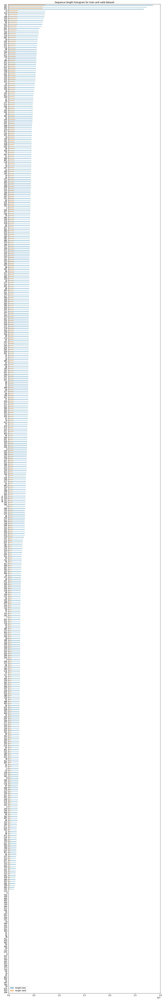

In [212]:
df_train_split.plot(kind='barh', alpha=0.5, figsize=(15,100), grid=True, title='Sequence length histogram for train and valid dataset');

In [ ]:
# SPLIT to another TEST set for training? 70-20-10?

### blastn WIP

In [ ]:
# concatenate all raw fasta files into one file
#! cat CR_*.fasta > allseq.fasta

[Linkt to file](/files/Documents/UGenoMFiT/ChallengeRefGenomes/test.fasta)

In [ ]:
# https://github.com/nspies/genomeview ?

# Test dataset (Test, NTC, and POS genomes)

In [3]:
PATH_CH1 = Path('Challenge_Data_Sets')
PATH_CH2 = Path('Challenge_Data_NTC_POS')

## Convert fastq files to csv

In [94]:
# Based on https://github.com/frenzymadness/FastQ_converter
def convert_fastq_to_csv(in_file, out_file):
    out_file.write(u'"id","sequence","quality"\n')
    for line in in_file:
        if not line.startswith('@'):
            continue
        seq_id = line.strip()
        sequence = next(in_file).strip()
        next(in_file)
        quality = next(in_file).strip()
        out_file.write(u'"{}","{}","{}"\n'.format(seq_id, sequence, quality))

In [95]:
# Based on https://github.com/frenzymadness/FastQ_converter
def batch_conv_fastq_to_csv(path, extensions=['.fq','.fastq']):
    for ext in extensions:
        fns = get_files(path, extension=ext)
        for fn in fns:
            fn_out = ''.join(fn.path.split(ext)[:-1])+'.csv'
            with open(fn) as infd:
                with open(fn_out, 'w') as outfd:
                    convert_fastq_to_csv(infd, outfd)

In [96]:
# convert fastq files to csv in PATH_CH1
batch_conv_fastq_to_csv(PATH_CH1)

In [97]:
# convert fastq files to csv in PATH_CH2
batch_conv_fastq_to_csv(PATH_CH2)

## EDA per fastq file

In [5]:
#def get_fastq_df(path, extensions=['.fq','.fastq']):
#    for ext in extensions:
#        seq, lbs, score = [], [], []
#        for f in get_seq_files(path, extension=ext):
#            for rec in SeqIO.parse(f, 'fastq'):
#                seq.append(str(rec.seq.upper())) # append sequence
#                lbs.append(str(rec.name)) # append sequence name
#                score.append(record.letter_annotations['phred_quality']) # append phred score
#    return pd.DataFrame({'label': lbs, 'sequence': seq, 'score': score})

In [10]:
def get_fastq_eda(path, extensions=['.fq','.fastq']):
    '''
    Function to display information of fastq files from a directory.
    '''
    for ext in extensions:
        for f in get_files(path, extension=ext):
            seq, lbs, score = [], [], []
            print(f'file: {f.path}') # print file path
            for rec in SeqIO.parse(f, 'fastq'):
                seq.append(str(rec.seq.upper())) # append sequence
                lbs.append(str(rec.name)) # append sequence name
                score.append(rec.letter_annotations['phred_quality']) # append phred score
            
            df = pd.DataFrame({'label': lbs, 'sequence': seq, 'score': score}) # create df from the lists
            del seq, lbs, score # delete df to free up RAM
            
            assert df.isna().sum().sum() == 0 # check for NaN values
            #assert df.duplicated().sum() == 0 # check for duplicates
            
            print(f'seqn: {df.shape[0]}') # print sequence count
            
            df['length'] = df['sequence'].apply(lambda x: len(x)) # create length col with sequence lengths

            # check if sequence and score length match
            df['length_q'] = df['score'].apply(lambda x: len(x))
            df['check'] = ~(df['length'] == df['length_q']) # not(equal)
            assert df['check'].sum() == 0
            df = df.drop(['length_q','check'], axis=1) # remove cols to reduce df size after check
            
            # plot sequence length histogramm
            df['length'].plot(kind='hist', alpha=0.5, figsize=(15,5), title=f'Sequence length histogram {f.name}');
            
            # plot sequence scores
            df = df.sort_values(by='length', ascending=False)
            #df_plot = pd.concat((df_test.iloc[:50], df_test.iloc[-50:]), axis=0)
            
            n = 500

            plt.figure(figsize=(15,5))
            plt.title(f'Scores of longest {n} sequences {f.name}')
            for i, row in df.iloc[:n].iterrows():
                plt.plot(row['score'], alpha=0.05)
            
            plt.figure(figsize=(15,5))
            plt.title(f'Scores of shortest {n} sequences {f.name}')
            for i, row in df.iloc[-n:].iterrows():
                plt.plot(row['score'], alpha=0.05)
            
            #plt.figure(figsize=(15,5))
            #plt.title(f'Sequence scores {f.name}')
            #for i, row in df_plot.iterrows():
            #    plt.plot(row['score'], alpha=0.01)
            
            del df # delete df to free up RAM
            #return df

file: Challenge_Data_Sets/C04_R1.fq
seqn: 4000000
file: Challenge_Data_Sets/C08_R1.fq
seqn: 5684638
file: Challenge_Data_Sets/C03_R2.fq
seqn: 4000000
file: Challenge_Data_Sets/C05_R1.fq
seqn: 4000000
file: Challenge_Data_Sets/C02_R1.fq
seqn: 4000000
file: Challenge_Data_Sets/C06_R1.fq
seqn: 4000000
file: Challenge_Data_Sets/C01_R1.fq
seqn: 4000000
file: Challenge_Data_Sets/C07_R1.fq
seqn: 5331259
file: Challenge_Data_Sets/C03_R1.fq
seqn: 4000000
file: Challenge_Data_Sets/C01_R2.fq
seqn: 4000000


/home/mmp/anaconda3/envs/biopython/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


file: Challenge_Data_Sets/C09_R2.fq
seqn: 5965505


/home/mmp/anaconda3/envs/biopython/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


file: Challenge_Data_Sets/C06_R2.fq
seqn: 4000000


/home/mmp/anaconda3/envs/biopython/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


file: Challenge_Data_Sets/C04_R2.fq
seqn: 4000000


/home/mmp/anaconda3/envs/biopython/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


file: Challenge_Data_Sets/C08_R2.fq
seqn: 5684638


/home/mmp/anaconda3/envs/biopython/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


file: Challenge_Data_Sets/C09_R1.fq
seqn: 5965505


/home/mmp/anaconda3/envs/biopython/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


file: Challenge_Data_Sets/C07_R2.fq
seqn: 5331259


/home/mmp/anaconda3/envs/biopython/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


file: Challenge_Data_Sets/C05_R2.fq
seqn: 4000000


/home/mmp/anaconda3/envs/biopython/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


file: Challenge_Data_Sets/C02_R2.fq
seqn: 4000000


/home/mmp/anaconda3/envs/biopython/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


file: Challenge_Data_Sets/C12_R2.fastq
seqn: 7697840


/home/mmp/anaconda3/envs/biopython/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


file: Challenge_Data_Sets/C11_R1.fastq
seqn: 6076084


/home/mmp/anaconda3/envs/biopython/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


file: Challenge_Data_Sets/C12_R1.fastq
seqn: 7697840


/home/mmp/anaconda3/envs/biopython/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


file: Challenge_Data_Sets/C10_R2.fastq
seqn: 5204702


/home/mmp/anaconda3/envs/biopython/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


file: Challenge_Data_Sets/C15_R1.fastq
seqn: 7508898


/home/mmp/anaconda3/envs/biopython/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


file: Challenge_Data_Sets/C13_R2.fastq
seqn: 5004408


/home/mmp/anaconda3/envs/biopython/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


file: Challenge_Data_Sets/C14_R1.fastq
seqn: 6491625


/home/mmp/anaconda3/envs/biopython/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


file: Challenge_Data_Sets/C14_R2.fastq
seqn: 6491625


/home/mmp/anaconda3/envs/biopython/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


file: Challenge_Data_Sets/C13_R1.fastq
seqn: 5004408


/home/mmp/anaconda3/envs/biopython/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


file: Challenge_Data_Sets/C11_R2.fastq
seqn: 6076084


/home/mmp/anaconda3/envs/biopython/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


file: Challenge_Data_Sets/C10_R1.fastq
seqn: 5204702


/home/mmp/anaconda3/envs/biopython/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


file: Challenge_Data_Sets/C15_R2.fastq
seqn: 7508898


/home/mmp/anaconda3/envs/biopython/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


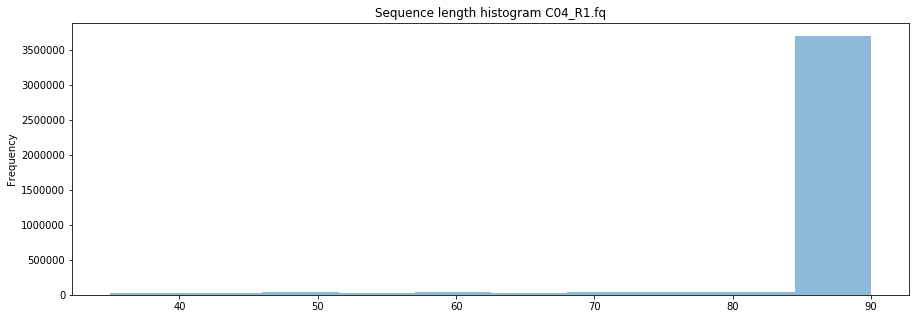

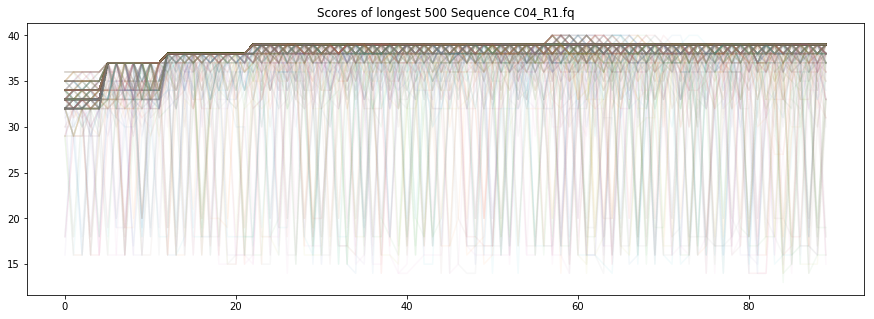

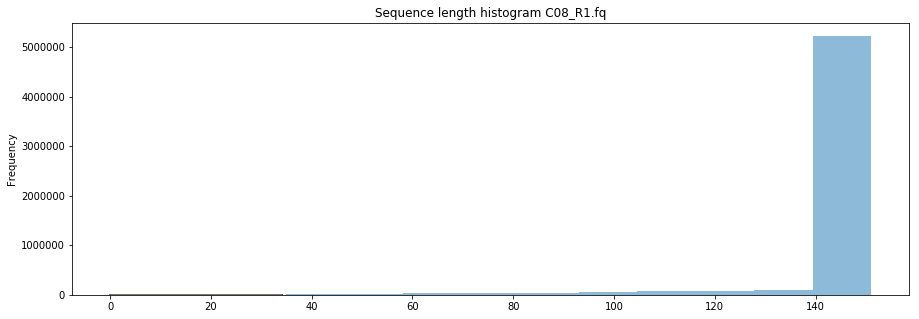

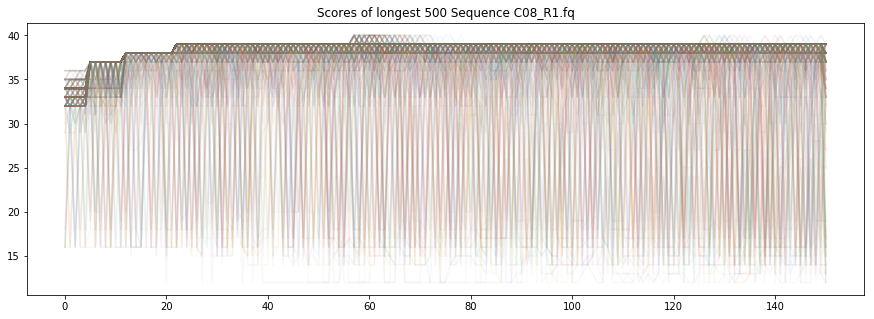

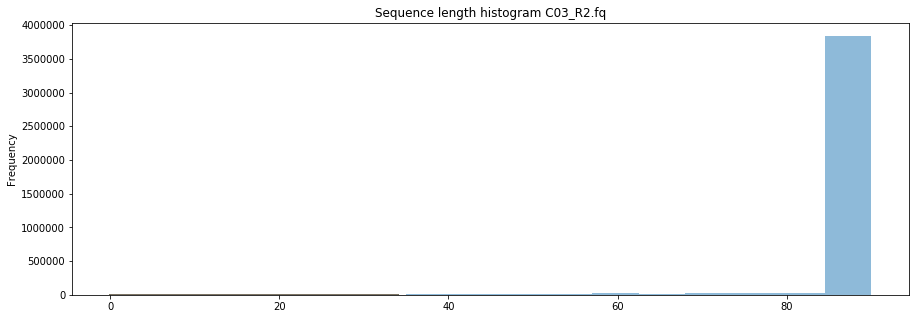

...

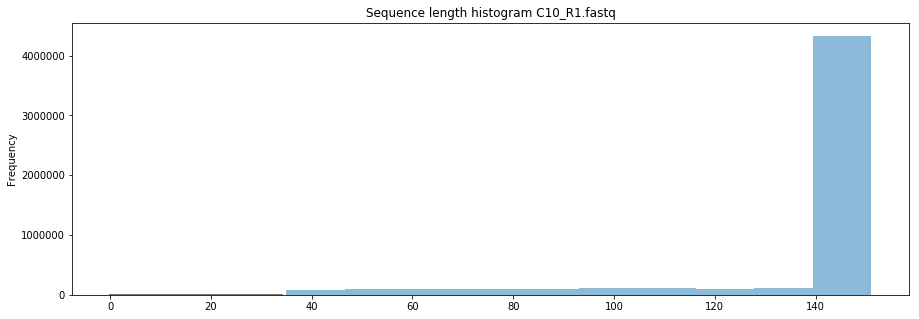

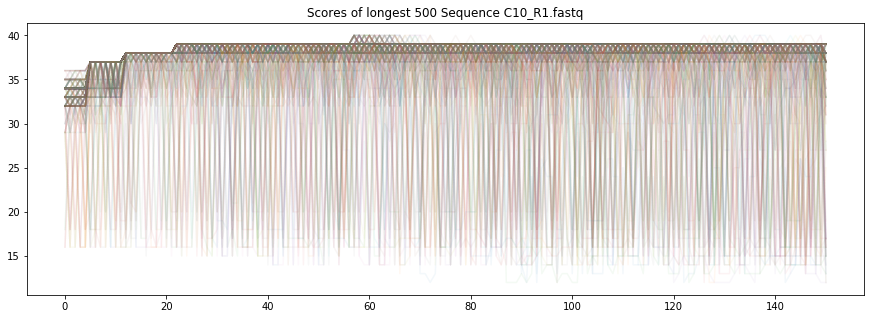

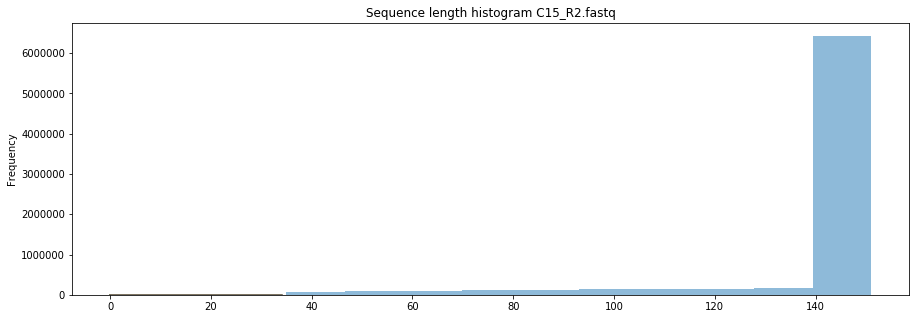

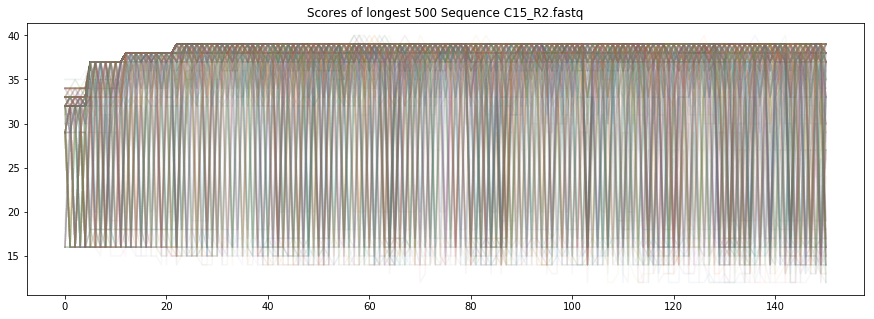

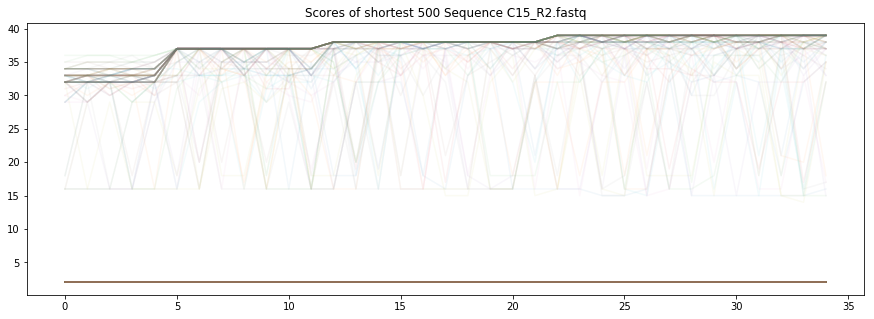

In [12]:
get_fastq_eda(PATH_CH1)

file: Challenge_Data_NTC_POS/C20_R2.fastq
seqn: 889480
file: Challenge_Data_NTC_POS/C17_R2.fastq
seqn: 764908
file: Challenge_Data_NTC_POS/C16_R2.fastq
seqn: 891992
file: Challenge_Data_NTC_POS/C21_R1.fastq
seqn: 372105
file: Challenge_Data_NTC_POS/C18_R1.fastq
seqn: 786779
file: Challenge_Data_NTC_POS/C18_R2.fastq
seqn: 786779
file: Challenge_Data_NTC_POS/C16_R1.fastq
seqn: 891992
file: Challenge_Data_NTC_POS/C21_R2.fastq
seqn: 372105
file: Challenge_Data_NTC_POS/C17_R1.fastq
seqn: 764908
file: Challenge_Data_NTC_POS/C20_R1.fastq
seqn: 889480


/home/mmp/anaconda3/envs/biopython/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


file: Challenge_Data_NTC_POS/C19_R1.fastq
seqn: 339458


/home/mmp/anaconda3/envs/biopython/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


file: Challenge_Data_NTC_POS/C19_R2.fastq
seqn: 339458


/home/mmp/anaconda3/envs/biopython/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


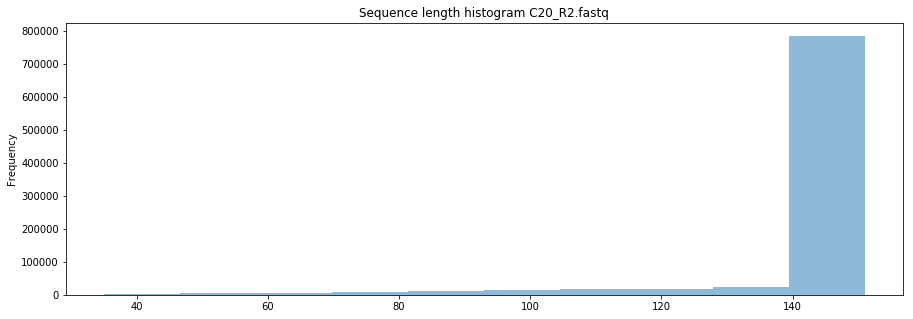

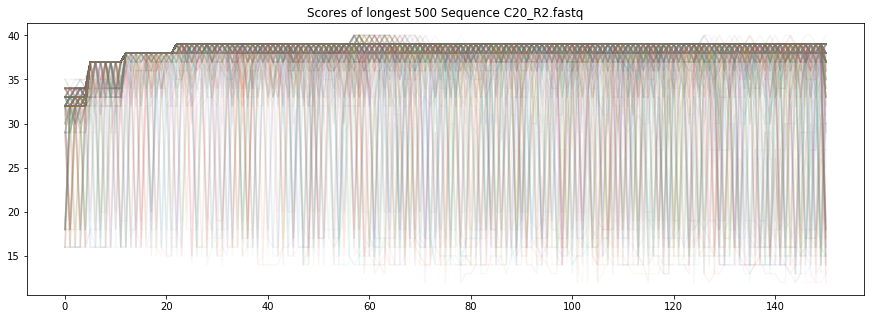

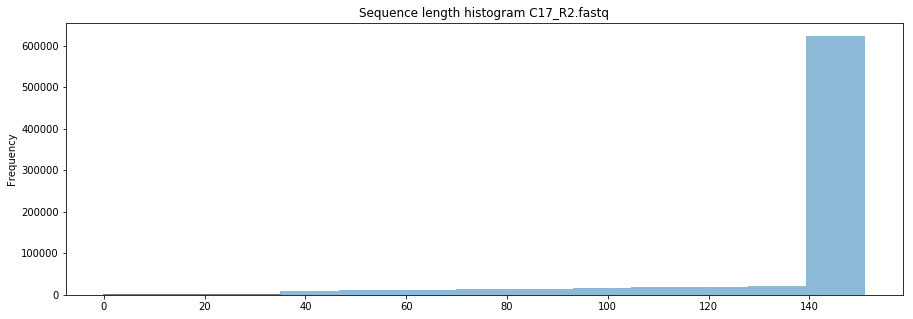

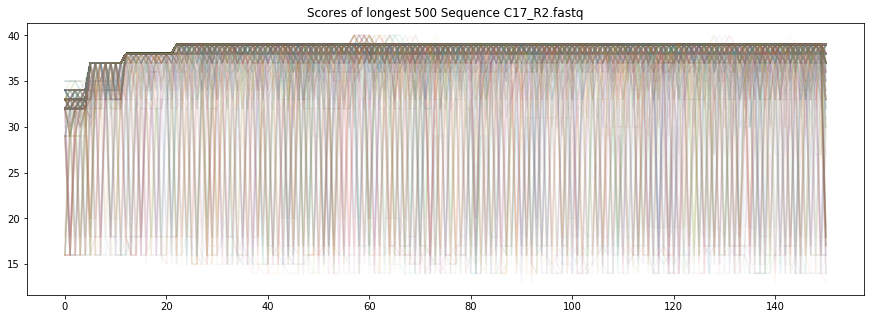

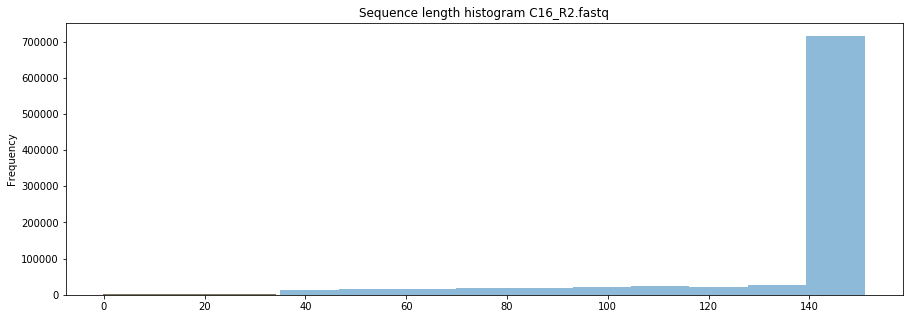

...

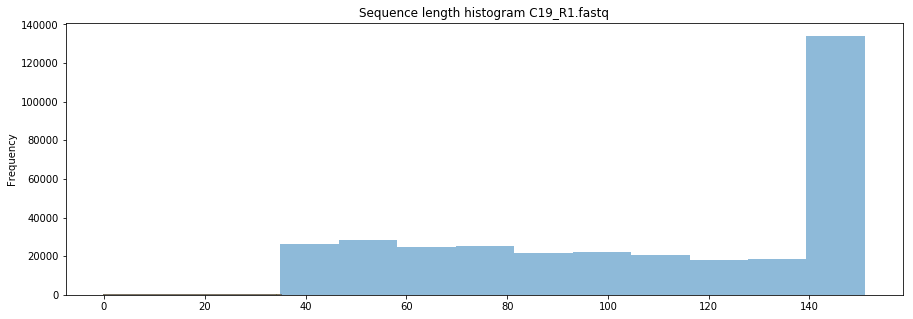

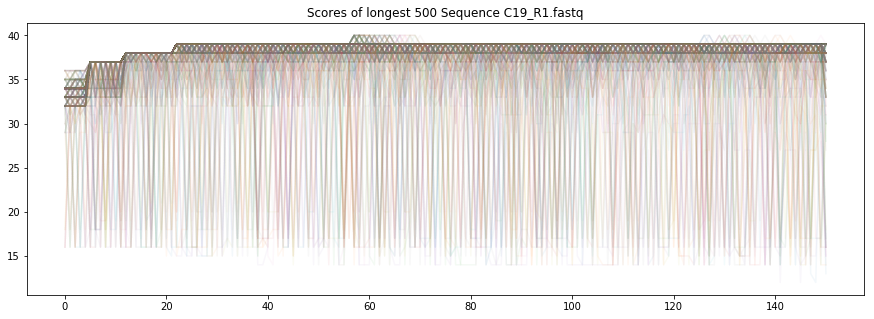

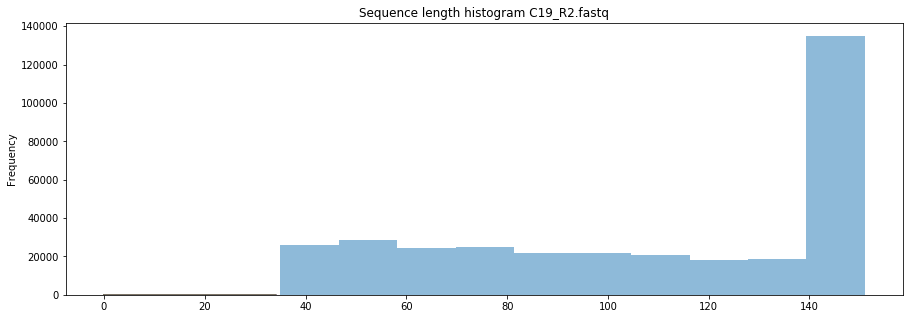

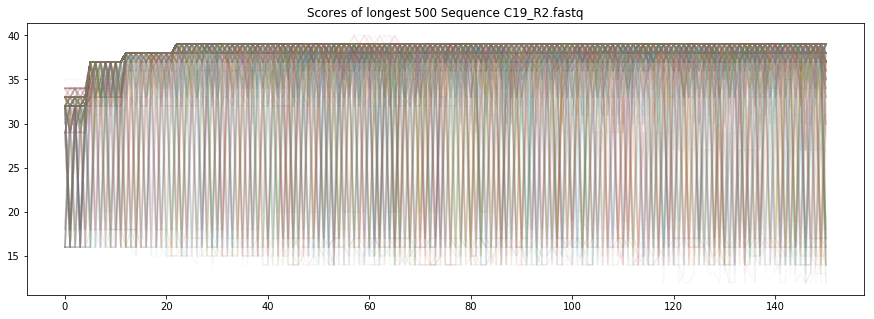

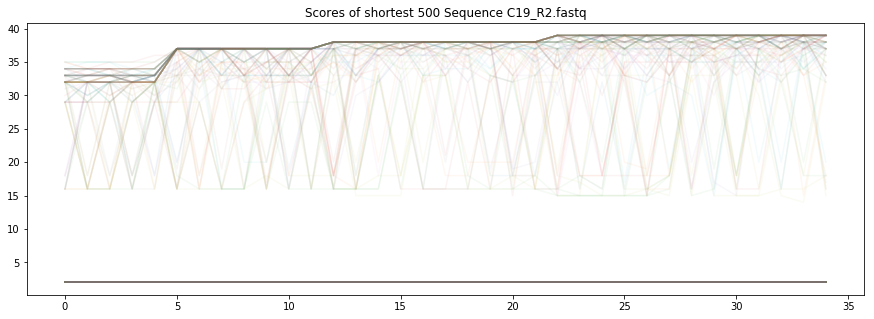

In [11]:
get_fastq_eda(PATH_CH2)

## EDA Test

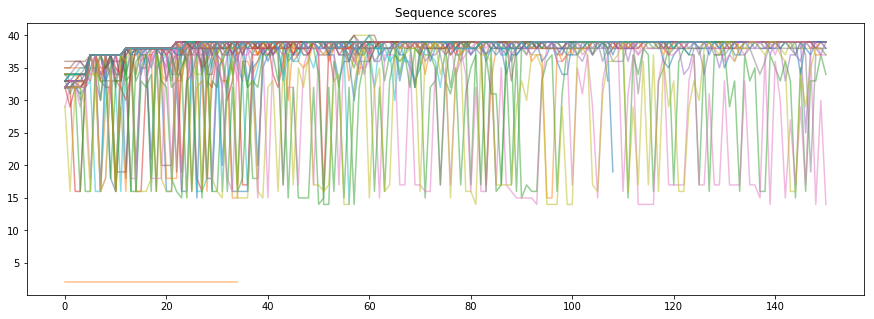

In [225]:
# score plot directly from df
plt.figure(figsize=(15,5))
plt.title(f'Sequence scores')
for i, row in df.iloc[:50].iterrows():
    plt.plot(row['score'], alpha=0.5)

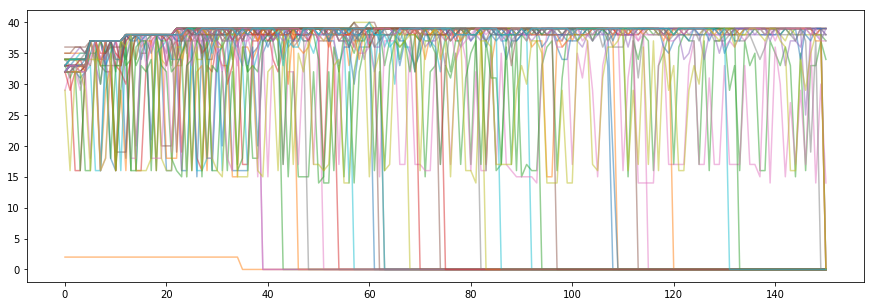

In [226]:
# score plot directly from np.array from df
# problem: zeros for small sequences are ploted too.
max_len = df['length'].max()
rows = df.shape[0]
data = np.zeros((rows, max_len))

for i, row in df.iloc[:50].iterrows():
    score_len = len(row['score'])
    data[i] = np.concatenate((np.array(row['score']),np.zeros(max_len-score_len)), axis=0)

plt.figure(figsize=(15,5))
plt.plot(data[:50].transpose(), alpha=0.5);

In [ ]:
# plot quicker? http://exnumerus.blogspot.com/2011/02/how-to-quickly-plot-multiple-line.html

In [251]:
test_path = Path('Challenge_Data_NTC_POS/test')

file: Challenge_Data_NTC_POS/test/C19_R1.fastq
seqn: 339458


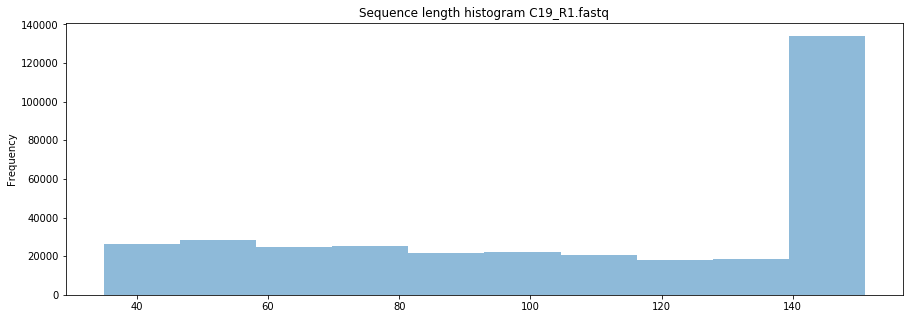

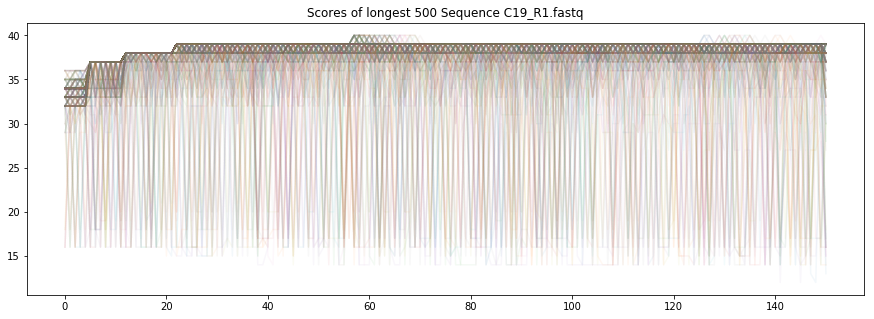

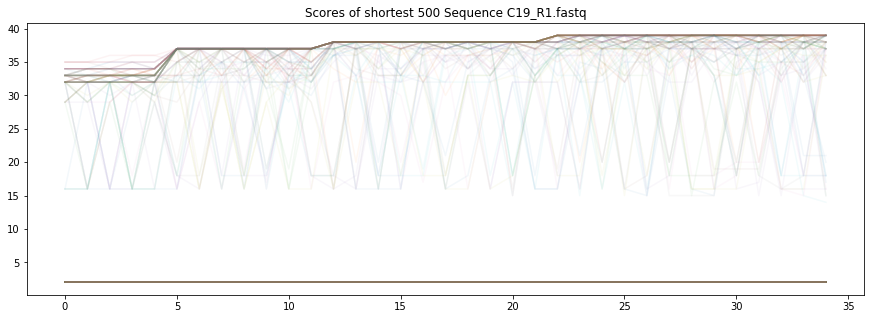

In [252]:
df = get_fastq_eda('Challenge_Data_NTC_POS/test')

# Data augmentation